In [1]:
cd ..

/Users/ricardo/git/numbers


In [13]:
import src.fractals as fractals

import matplotlib.cm


In [3]:
[fractals.mandelbrot_sequence_index(x,1) for x in range(11)]

[0,
 1,
 2,
 5,
 26,
 677,
 458330,
 210066388901,
 44127887745906175987802,
 1947270476915296449559703445493848930452791205,
 3791862310265926082868235028027893277370233152247388584761734150717768254410341175325352026]

In [4]:
gen_mandelbrot = fractals.mandelbrot_sequence(0.24)

In [5]:
next(gen_mandelbrot)

0

In [6]:
fractals.pixel_matrix(21)

array([[-2.        -1.5j       , -1.95098039-1.5j       ,
        -1.90196078-1.5j       , ...,  0.40196078-1.5j       ,
         0.45098039-1.5j       ,  0.5       -1.5j       ],
       [-2.        -1.4516129j , -1.95098039-1.4516129j ,
        -1.90196078-1.4516129j , ...,  0.40196078-1.4516129j ,
         0.45098039-1.4516129j ,  0.5       -1.4516129j ],
       [-2.        -1.40322581j, -1.95098039-1.40322581j,
        -1.90196078-1.40322581j, ...,  0.40196078-1.40322581j,
         0.45098039-1.40322581j,  0.5       -1.40322581j],
       ...,
       [-2.        +1.40322581j, -1.95098039+1.40322581j,
        -1.90196078+1.40322581j, ...,  0.40196078+1.40322581j,
         0.45098039+1.40322581j,  0.5       +1.40322581j],
       [-2.        +1.4516129j , -1.95098039+1.4516129j ,
        -1.90196078+1.4516129j , ...,  0.40196078+1.4516129j ,
         0.45098039+1.4516129j ,  0.5       +1.4516129j ],
       [-2.        +1.5j       , -1.95098039+1.5j       ,
        -1.90196078+1.5j      

/Users/ricardo/git/numbers/src/fractals.py:56: RuntimeWarning: overflow encountered in square
  z = z**2 + c
/Users/ricardo/git/numbers/src/fractals.py:56: RuntimeWarning: invalid value encountered in square
  z = z**2 + c


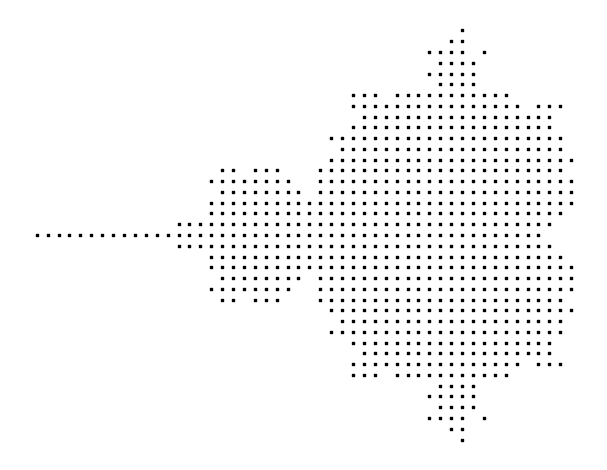

In [7]:
fractals.plot_mandelbrot_ori()

/Users/ricardo/git/numbers/src/fractals.py:57: RuntimeWarning: overflow encountered in absolute
  return abs(z) <= 2


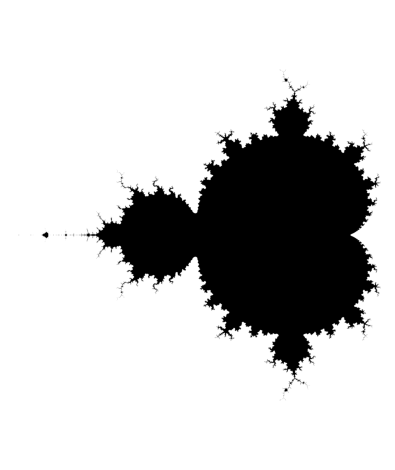

In [8]:
fractals.plot_mandelbrot(pixel_density=1024)


In [9]:
mandelbrot_set = fractals.MandelbrotSet(max_iterations=25, escape_radius=1000)

width, height = 512, 512
scale = 0.0075
GRAYSCALE = "L"

from PIL import Image
image = Image.new(mode=GRAYSCALE, size=(width, height))
for y in range(height):
    for x in range(width):
        c = scale * complex(x - width / 2, height / 2 - y)
        instability = 1 - mandelbrot_set.stability(c, smooth=True)
        image.putpixel((x, y), int(instability * 255))

image.show()

In [10]:
from PIL import Image
from src.utils.viewport import Viewport

mandelbrot_set = fractals.MandelbrotSet(max_iterations=256, escape_radius=1000)

image = Image.new(mode="L", size=(512, 512))
# https://en.wikipedia.org/wiki/Mandelbrot_set#Image_gallery_of_a_zoom_sequence
for pixel in Viewport(image, center=-0.7435 + 0.1314j, width=0.016):
    c = complex(pixel)
    instability = 1 - mandelbrot_set.stability(c, smooth=True)
    pixel.color = int(instability * 255)

image.show()

In [75]:

def paint(mandelbrot_set, viewport, palette, smooth):
    for pixel in viewport:
        stability = mandelbrot_set.stability(complex(pixel), smooth)
        index = int(min(stability * len(palette), len(palette) - 1))
        pixel.color = palette[index % len(palette)]

def denormalize(palette):
    return [
        tuple(int(channel * 255) for channel in color)
        for color in palette
    ]

def get_denormalized_palette(name:str):
    cmap = matplotlib.cm.get_cmap(name)
    try:
        colormap = cmap.colors
    except AttributeError:
        colormap = [cmap(x/1000) for x in range(1000)]
    return denormalize(colormap)

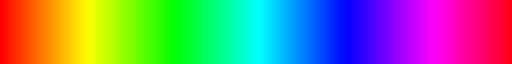

In [ ]:
matplotlib.colormaps["hsv"]

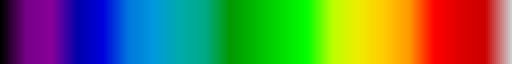

In [61]:
matplotlib.colormaps["nipy_spectral"]

In [113]:
palette = list(reversed(get_denormalized_palette('prism')))

mandelbrot_set = fractals.MandelbrotSet(max_iterations=512, escape_radius=1000)
image = Image.new(mode="RGB", size=(512, 512))
viewport = Viewport(image, center=-0.7435 + 0.1314j, width=0.016)
paint(mandelbrot_set, viewport, palette, smooth=True)
image.show()


/var/folders/m8/xdt0_33s3vj1_8q5nl0qf05w0000gn/T/ipykernel_25105/429857849.py:14: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = matplotlib.cm.get_cmap(name)


In [115]:
images = []
for palette_name in ['viridis', 'cividis', 'gnuplot', 'hot', 'seismic', 'coolwarm', 'flag', 
                     'prism', 'brg', 'gist_rainbow', 'jet', 'turbo']:
    palette = get_denormalized_palette(palette_name)

    mandelbrot_set = fractals.MandelbrotSet(max_iterations=512, escape_radius=1000)
    image = Image.new(mode="RGB", size=(512, 512))
    viewport = Viewport(image, center=-0.7435 + 0.1314j, width=0.016)
    paint(mandelbrot_set, viewport, palette, smooth=True)
    images.append(image)
images

/var/folders/m8/xdt0_33s3vj1_8q5nl0qf05w0000gn/T/ipykernel_25105/429857849.py:14: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = matplotlib.cm.get_cmap(name)


[<PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>]

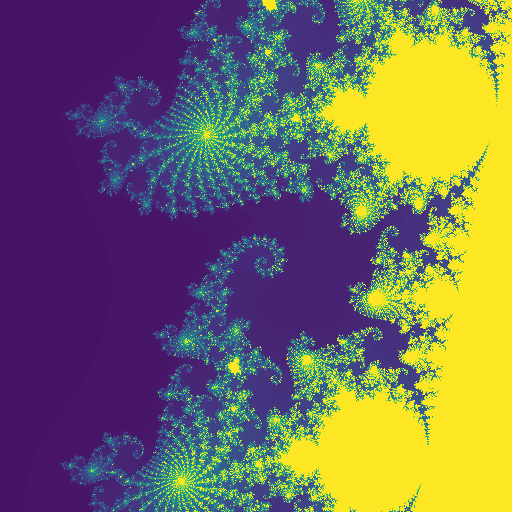

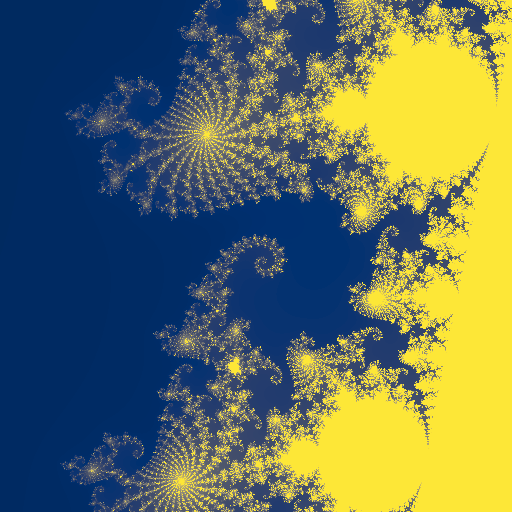

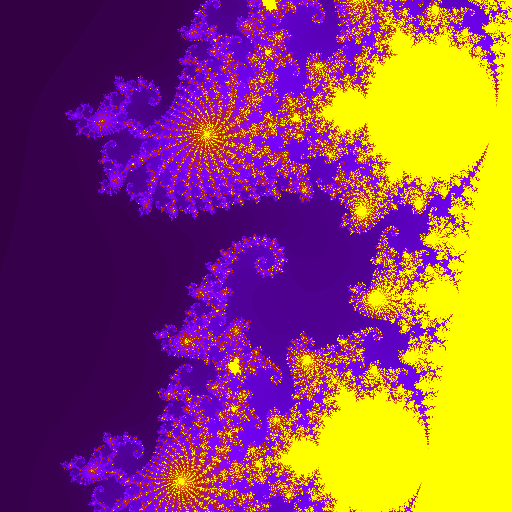

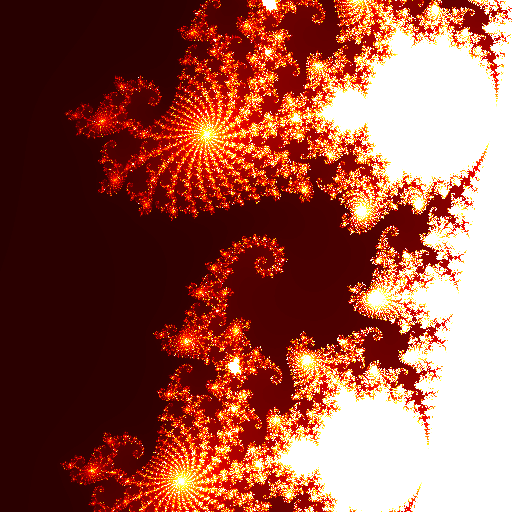

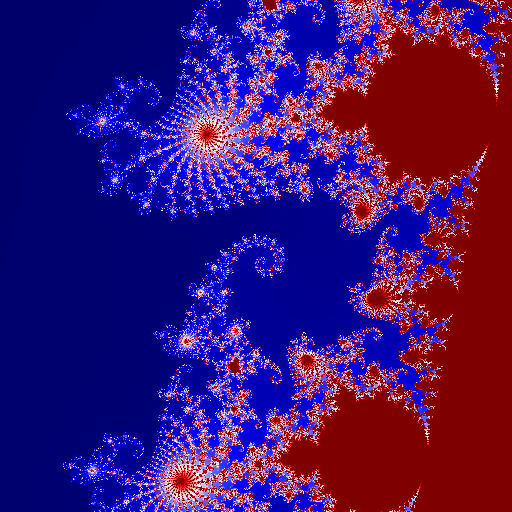

...

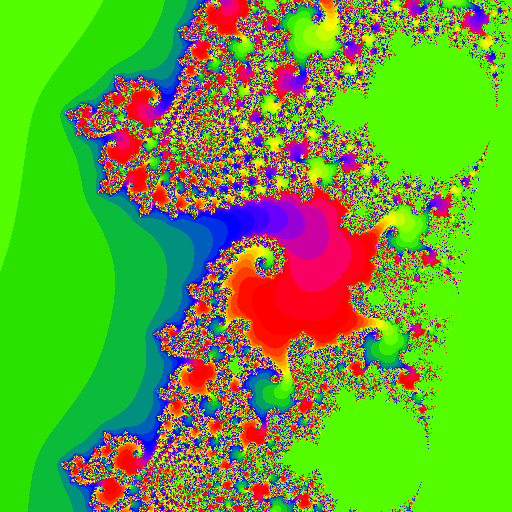

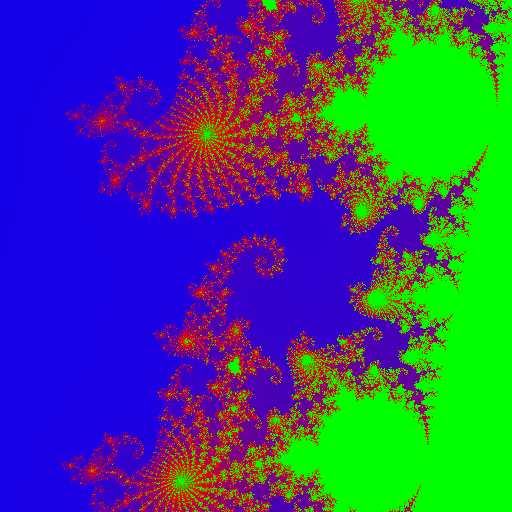

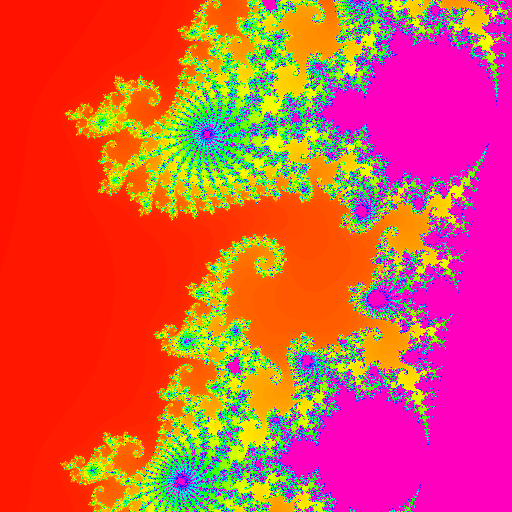

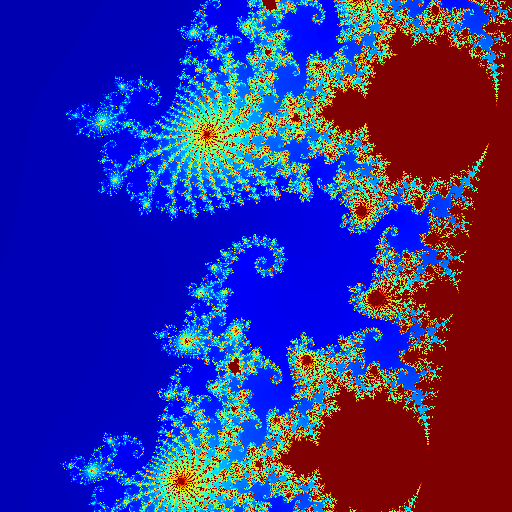

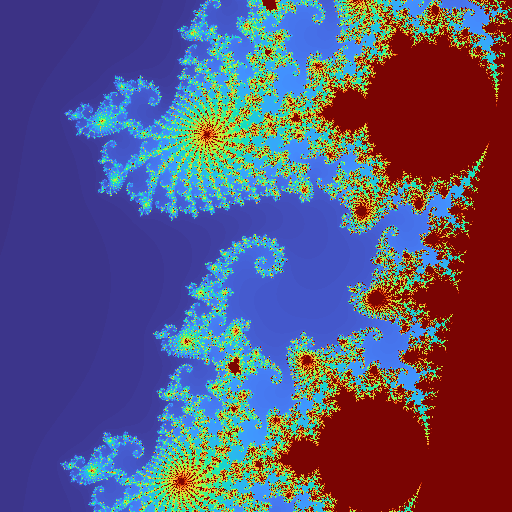

In [123]:
from IPython.display import display
for i,img in enumerate(images):
    #img.save(f'playground/out/{i}.png')
    display(img)

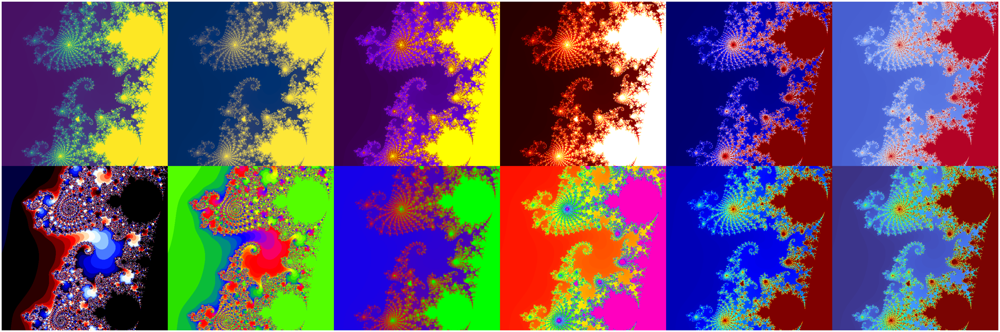

In [151]:
import numpy as np
import matplotlib.pyplot as plt

row1 = images[0]
row2 = images[6]
for i in range(1,6):
    row1 = np.hstack((row1, images[i]))
    row2 = np.hstack((row2, images[i+6]))
collage = np.vstack((row1, row2))

plt.figure(figsize = (60,20))
plt.imshow(collage)
plt.gca().set_aspect("auto")
plt.axis("off")
plt.tight_layout()
plt.show()